# Coin Detection

In [2]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [3]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

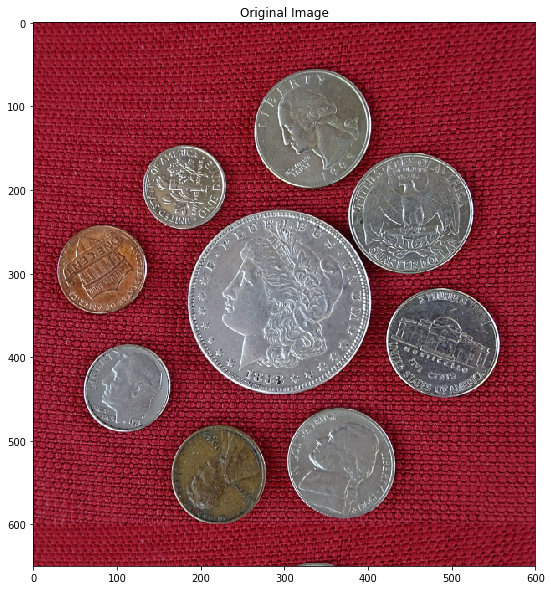

In [4]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image

image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [5]:
# Convert image to grayscale
# Store it in the variable imageGray

imageGray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

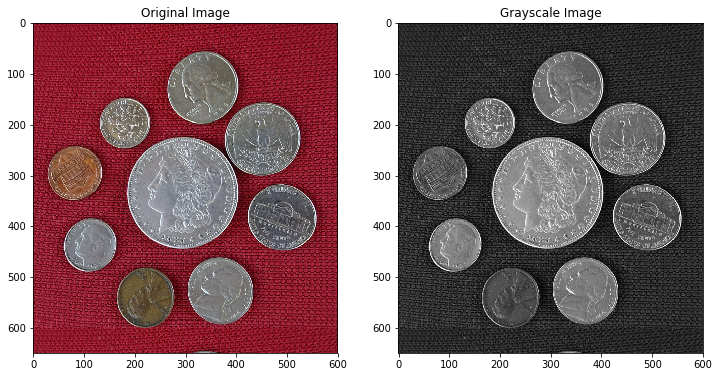

In [6]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [7]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR

imageB, imageG, imageR = cv2.split(image)

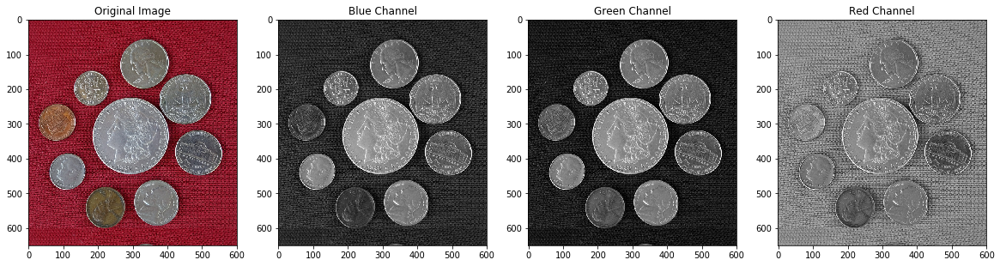

In [8]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

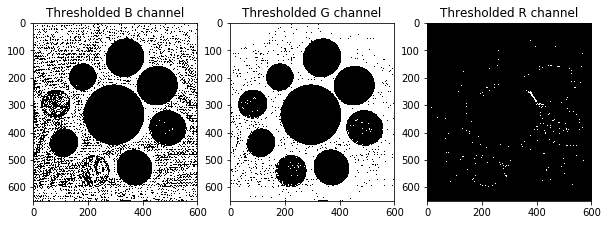

In [16]:

_, imageBThres = cv2.threshold(imageB, 55, 255, cv2.THRESH_BINARY_INV)
_, imageGThres = cv2.threshold(imageG, 55, 255, cv2.THRESH_BINARY_INV)
_, imageRThres = cv2.threshold(imageR, 55, 255, cv2.THRESH_BINARY_INV)

plt.subplot(131); plt.title("Thresholded B channel"); plt.imshow(imageBThres)
plt.subplot(132); plt.title("Thresholded G channel"); plt.imshow(imageGThres)
plt.subplot(133); plt.title("Thresholded R channel"); plt.imshow(imageRThres)

# setting thres image to green channel as it has the best contrast
imageThres = imageGThres

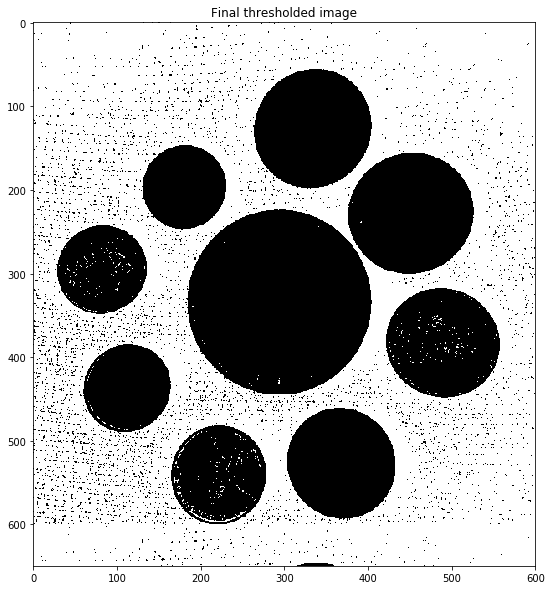

In [18]:
# Display the thresholded image

plt.title("Final thresholded image")
plt.imshow(imageThres)

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

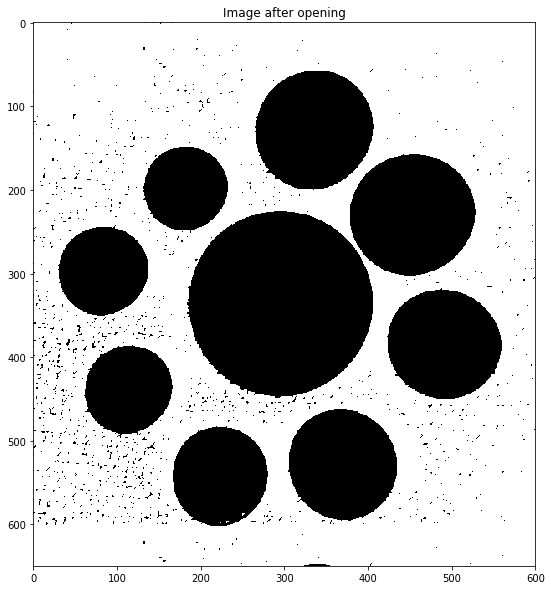

In [37]:

element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_OPEN, element, iterations=2)
plt.title("Image after opening")
plt.imshow(imageMorph)

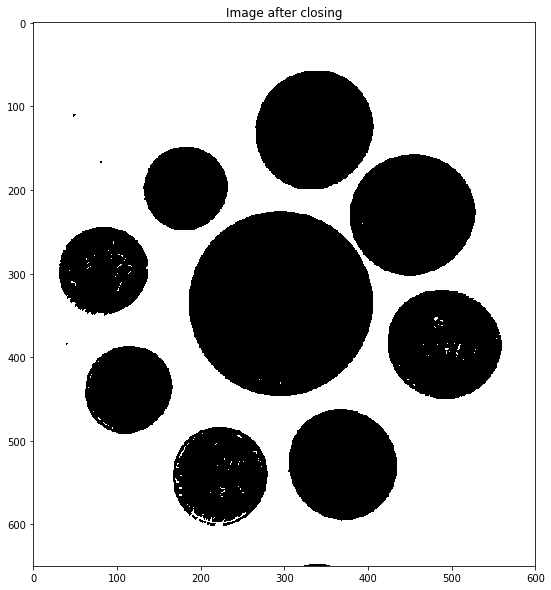

In [38]:

# imageMorph = cv2.dilate(imageMorph, element, iterations=2)
# imageMorph = cv2.erode(imageMorph, element, iterations=2)

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_CLOSE, element, iterations=2)
plt.title("Image after closing")
plt.imshow(imageMorph)

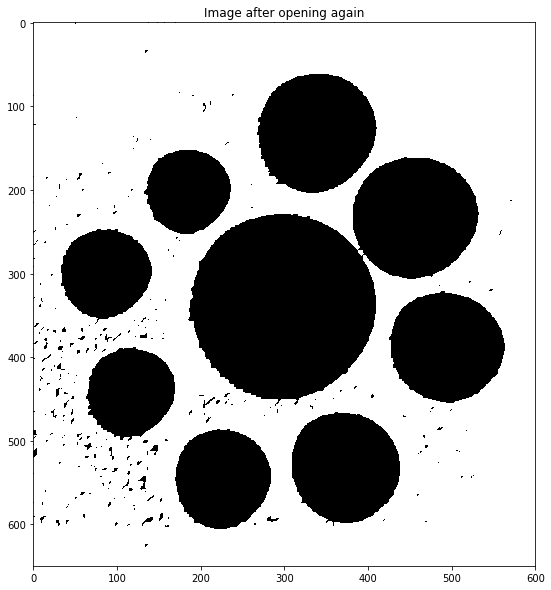

In [40]:
# Display all the images
# you have obtained in the intermediate steps

imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, element, iterations=3)
plt.title("Image after opening again")
plt.imshow(imageMorph)

In [41]:
# Get structuring element/kernel which will be used for dilation

element2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
element3 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))


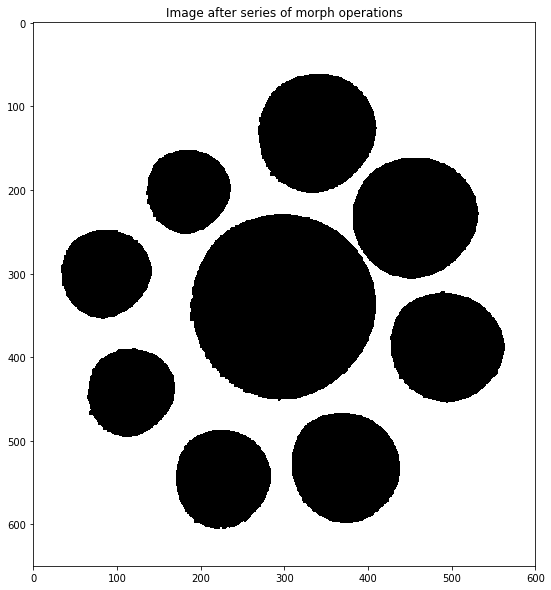

In [130]:

imageMorph = imageThres.copy()

imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, element2, iterations=2)
imageMorph = cv2.dilate(imageMorph, element2, iterations=1)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_CLOSE, element2, iterations=3)
imageMorph = cv2.erode(imageMorph, element2, iterations=1)
plt.title("Image after series of morph operations")
plt.imshow(imageMorph)

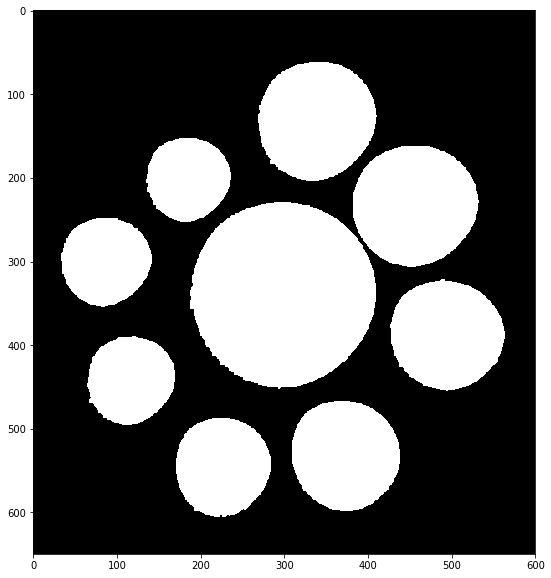

In [131]:
_, imageMorphInv = cv2.threshold(imageMorph, 100, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageMorphInv)

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [132]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [133]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

In [134]:
# Detect blobs

keypoints = detector.detect(imageMorph)

In [135]:
# Print number of coins detected

print(f"Number of blobs detected: {len(keypoints)}")

Number of blobs detected: 9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

In [136]:
# Mark coins using image annotation concepts we have studied so far

im = image.copy()

for k in keypoints:
    x, y = k.pt
    x = int(x)
    y = int(y)
    r = int(k.size // 2)
    cv2.circle(im, (x, y), 2, (255, 0, 0), -1)
    cv2.circle(im, (x, y), r, (0, 255, 0), 2)

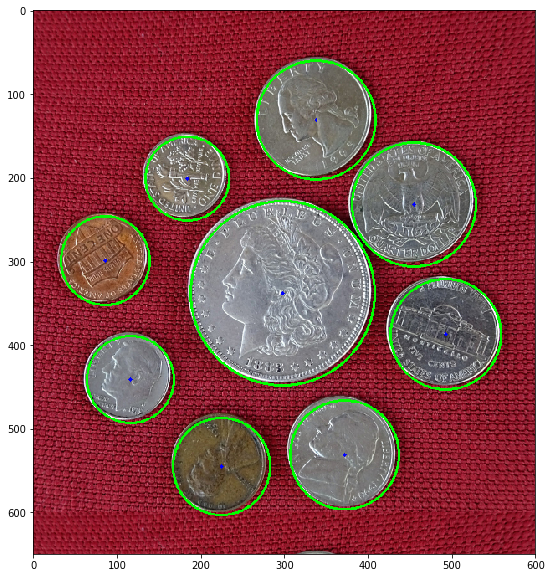

In [137]:
# Display the final image


plt.imshow(im[..., ::-1])

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In [138]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [139]:
# Find connected components

_, imComponents = cv2.connectedComponents(imageMorphInv)

In [140]:
# Print number of connected components detected

print(f"Number of connected components detected = {imComponents.max()}")

Number of connected components detected = 9


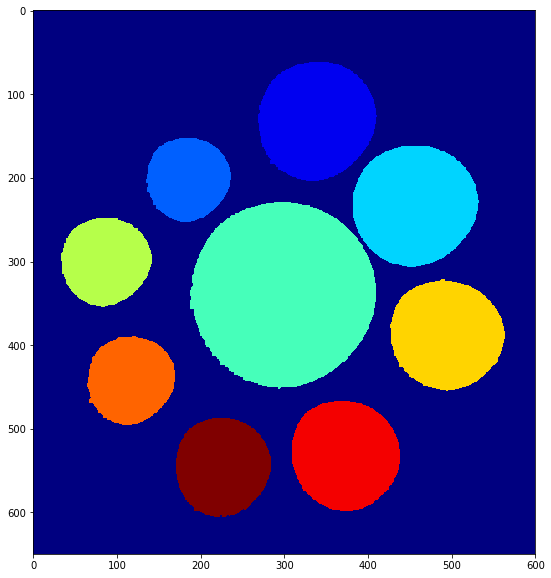

In [141]:
# Display connected components using displayConnectedComponents
# function

displayConnectedComponents(imComponents)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In [142]:
# Find all contours in the image

contours, hierarchy = cv2.findContours(imageMorph, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [143]:
# Print the number of contours found

print(f"Number of contours found = {len(contours)}")

Number of contours found = 10


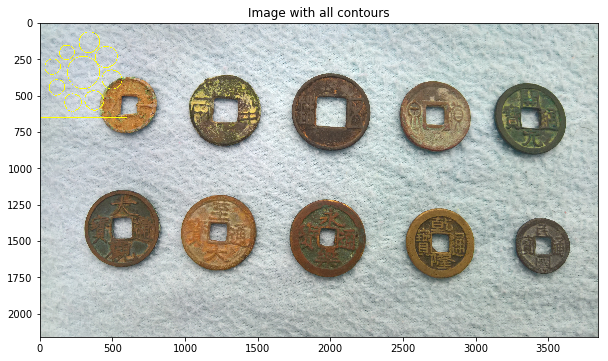

In [151]:
# Draw all contours

im2 = image.copy()
cv2.drawContours(im2, contours, -1, (0,255,255), 3, hierarchy=hierarchy)
plt.title("Image with all contours")
plt.imshow(im2[..., ::-1])

Let's only consider the outer contours.

In [145]:
# Remove the inner contours
# Display the result

ext_contours = [contours[i] for i, h in enumerate(hierarchy[0]) if h[3] == -1]
print(f"Number of outer contours {len(ext_contours)}")

Number of outer contours 1


So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [146]:
# Print area and perimeter of all contours

areas = []
for i, c in enumerate(contours):
    area = cv2.contourArea(c)
    areas.append(area)
    print(f"Contour #{i+1}  has area {area} and perimeter = {cv2.arcLength(c, True)}")

Contour #1  has area 388751.0 and perimeter = 2496.0
Contour #2  has area 10764.5 and perimeter = 401.40410816669464
Contour #3  has area 13684.5 and perimeter = 440.7178180217743
Contour #4  has area 8785.0 and perimeter = 360.190905213356
Contour #5  has area 14165.0 and perimeter = 453.788885474205
Contour #6  has area 9056.5 and perimeter = 362.4335472583771
Contour #7  has area 38632.5 and perimeter = 753.3107442855835
Contour #8  has area 17203.5 and perimeter = 492.31579637527466
Contour #9  has area 8024.5 and perimeter = 341.4629843235016
Contour #10  has area 15943.5 and perimeter = 480.5168082714081


In [147]:
# Print maximum area of contour
# This will be the box that we want to remove

print(f"Maximum area of the contour is {max(areas)}")

Maximum area of the contour is 388751.0


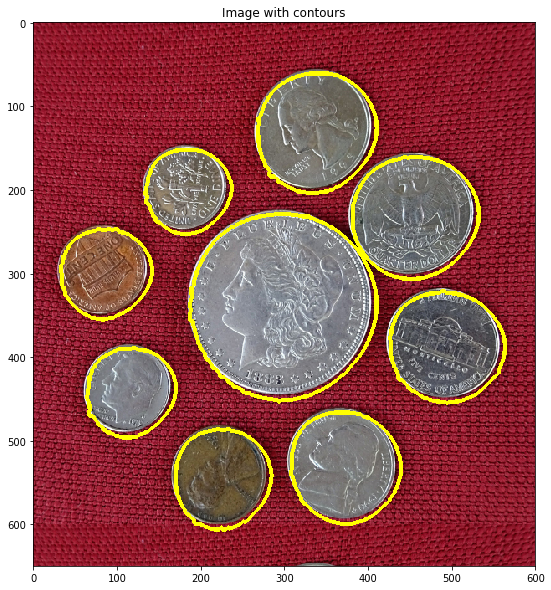

In [148]:
# Remove this contour and plot others

int_contours = contours[1:]
im3 = image.copy()
cv2.drawContours(im3, int_contours, -1, (0,255,255), 3)
plt.title("Image with contours")
plt.imshow(im3[..., ::-1])

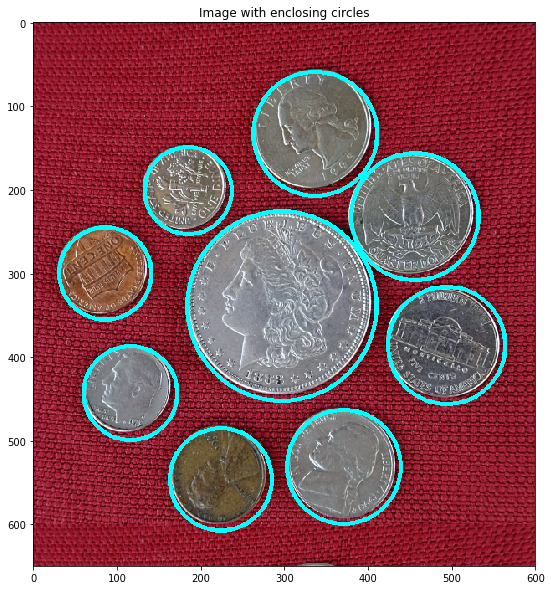

In [149]:
# Fit circles on coins

im4 = image.copy()

for c in int_contours:
    center, radius = cv2.minEnclosingCircle(c)
    
    cv2.circle(im4, (int(center[0]),int(center[1])), int(radius), (255, 255, 0), 3)

plt.title("Image with enclosing circles")
plt.imshow(im4[..., ::-1])

# <font style = "color:rgb(50,120,229)">Coins 2</font>

Text(0.5,1,'Original Image')

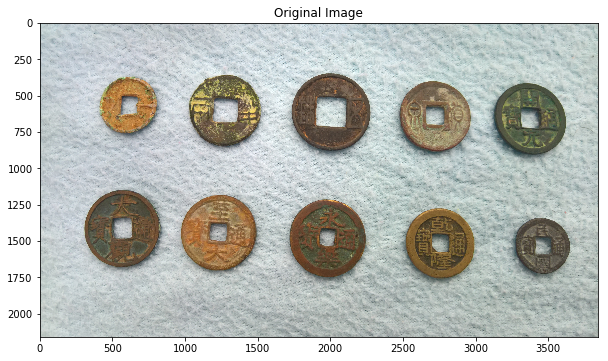

In [158]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image

image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [159]:
# Convert to grayscale
# Store in variable imageGray

imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

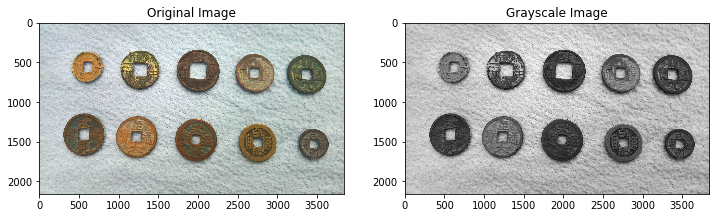

In [160]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [161]:
# Split cell into channels
# Variables are: imageB, imageG, imageR

imageB, imageG, imageR = cv2.split(image)

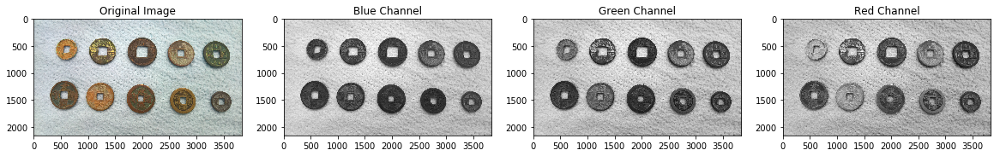

In [162]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

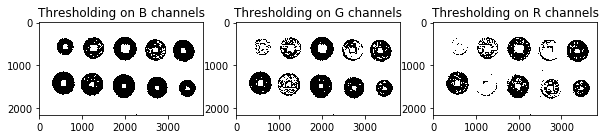

In [163]:
thres = 115
maxVal = 255

_, imageBThres = cv2.threshold(imageB, thres, maxVal, cv2.THRESH_BINARY)
_, imageGThres = cv2.threshold(imageG, thres, maxVal, cv2.THRESH_BINARY)
_, imageRThres = cv2.threshold(imageR, thres, maxVal, cv2.THRESH_BINARY)


plt.subplot(131); plt.title("Thresholding on B channels"); plt.imshow(imageBThres)
plt.subplot(132); plt.title("Thresholding on G channels"); plt.imshow(imageGThres)
plt.subplot(133); plt.title("Thresholding on R channels"); plt.imshow(imageRThres)

# setting thres image to green channel as it has the best contrast
imageThres = imageBThres

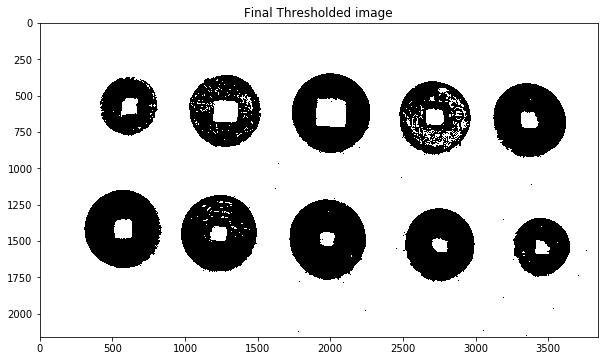

In [164]:
# Display image using matplotlib

plt.title("Final Thresholded image")
plt.imshow(imageThres)

In [165]:

kernel_elip2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2,2))
kernel_rect2 = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2))

kernel_elip3 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
kernel_rect3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))

kernel_elip5 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
kernel_rect5 = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))

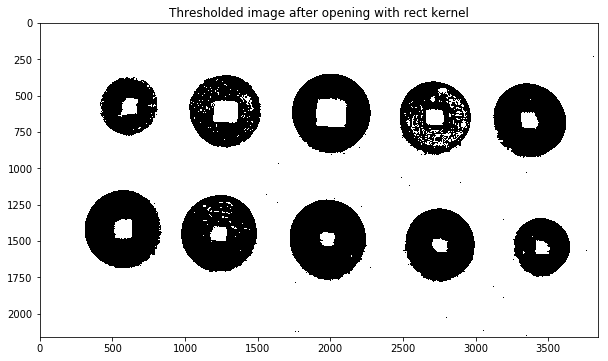

In [166]:

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_OPEN, kernel_rect2)
plt.title("Thresholded image after opening with rect kernel")
plt.imshow(imageMorph)

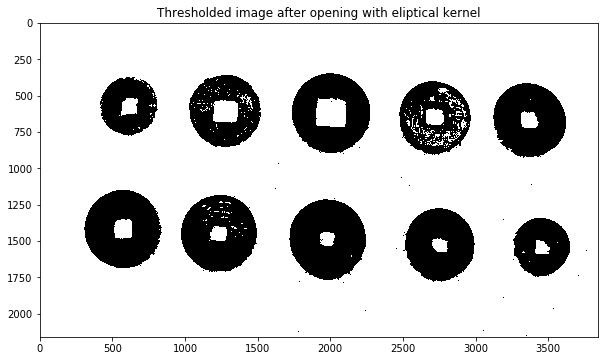

In [167]:

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_OPEN, kernel_elip3)
plt.title("Thresholded image after opening with eliptical kernel")
plt.imshow(imageMorph)

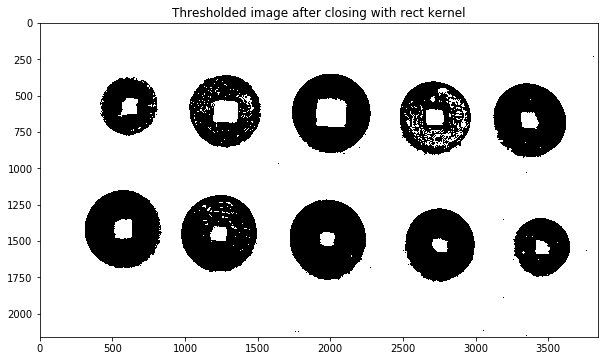

In [168]:

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_CLOSE, kernel_rect2)
plt.title("Thresholded image after closing with rect kernel")
plt.imshow(imageMorph)

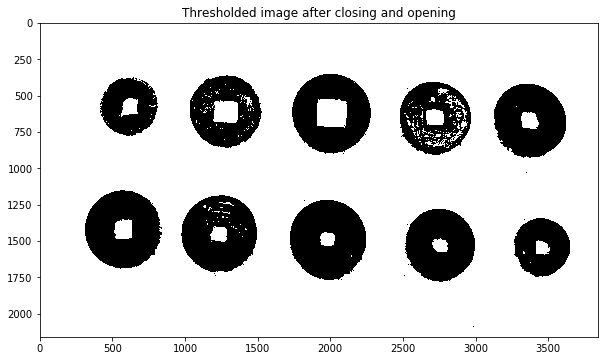

In [169]:

imageMorph = cv2.morphologyEx(imageThres, cv2.MORPH_CLOSE, kernel_rect2)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, kernel_elip2, iterations=2)
plt.title("Thresholded image after closing and opening")
plt.imshow(imageMorph)

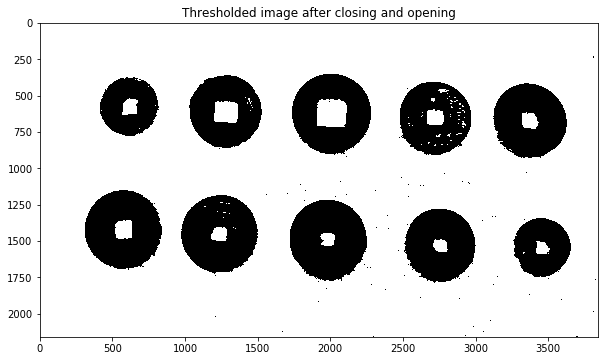

In [170]:

imageMorph = cv2.erode(imageThres, kernel_rect2, iterations=3)
# imageMorph = cv2.dilate(imageMorph, kernel_elip2, iterations=1)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, kernel_elip2, iterations=2)
# imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, kernel_elip3, iterations=1)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_CLOSE, kernel_elip3, iterations=2)
plt.title("Thresholded image after closing and opening")
plt.imshow(imageMorph)

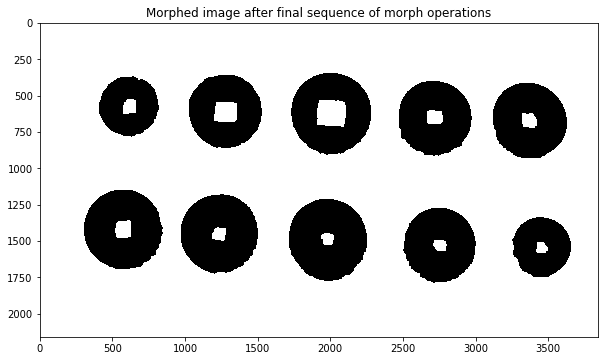

In [171]:

imageMorph = imageThres.copy()
imageMorph = cv2.erode(imageMorph, kernel_rect5, iterations=2)
imageMorph = cv2.dilate(imageMorph, kernel_elip2, iterations=3)
imageMorph = cv2.erode(imageMorph, kernel_rect3, iterations=2)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_CLOSE, kernel_elip5, iterations=5)
imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_OPEN, kernel_rect5, iterations=4)
# imageMorph = cv2.morphologyEx(imageMorph, cv2.MORPH_CLOSE, kernel_elip5, iterations=5)
plt.title("Morphed image after final sequence of morph operations")
plt.imshow(imageMorph)

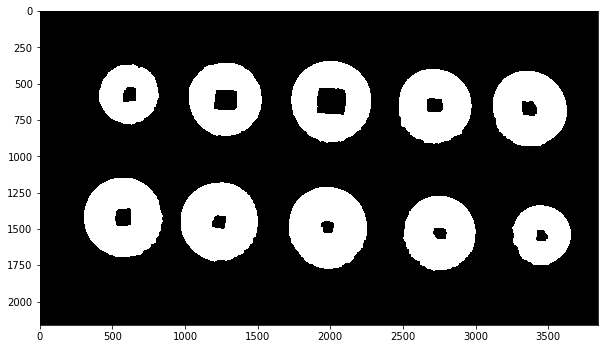

In [172]:
_, imageMorphInv = cv2.threshold(imageMorph, 100, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageMorphInv)

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [173]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [174]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

In [ ]:
# Detect blobs

keypoints = detector.detect(imageMorphInv)
print(f"Number of coins detected = {len(keypoints)}")


In [176]:

imageDisplay = image.copy()

In [177]:

for k in keypoints:
    x, y = k.pt
    x = int(x)
    y = int(y)
    r = int(k.size // 2)
    cv2.circle(imageDisplay, (x, y), 2, (0, 0, 0), -1)
    cv2.circle(imageDisplay, (x, y), r, (0, 0, 255), 10)

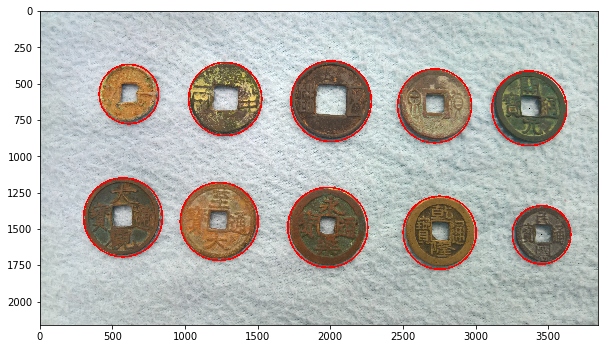

In [178]:

plt.imshow(imageDisplay[..., ::-1])

**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In [179]:

_, imLabels = cv2.connectedComponents(imageMorphInv)

In [180]:

print(f"Number of connected components detected = {imLabels.max()}")

Number of connected components detected = 10


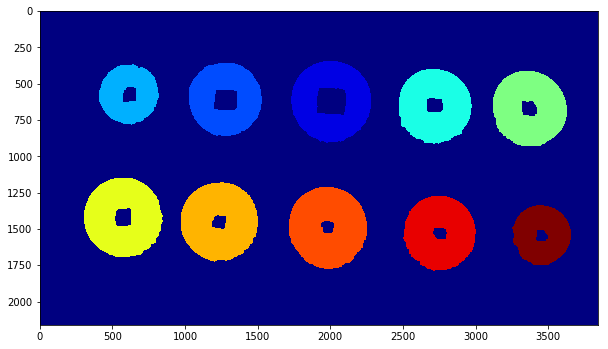

In [181]:

displayConnectedComponents(imLabels)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In [182]:
# Find all contours in the image

im2 = image.copy()
contours, hierarchy = cv2.findContours(imageMorph, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [183]:
# Print the number of contours found

print(f"Number of contours found = {len(contours)}")

Number of contours found = 21


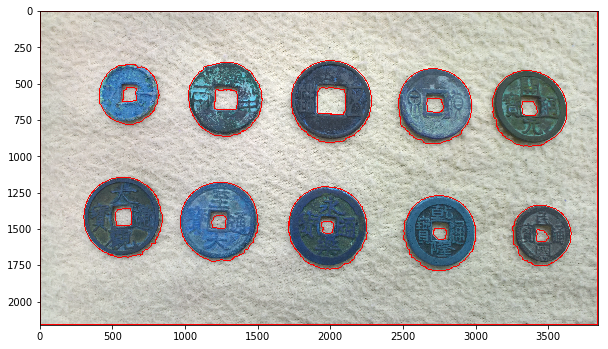

In [184]:
# Draw all contours

cv2.drawContours(im2, contours, -1, (255,0,0), 5)
plt.imshow(im2)

In [185]:
ext_contours = [contours[i] for i, h in enumerate(hierarchy[0]) if h[2] != -1]
print(f"Number of outer contours {len(ext_contours)}")

Number of outer contours 1


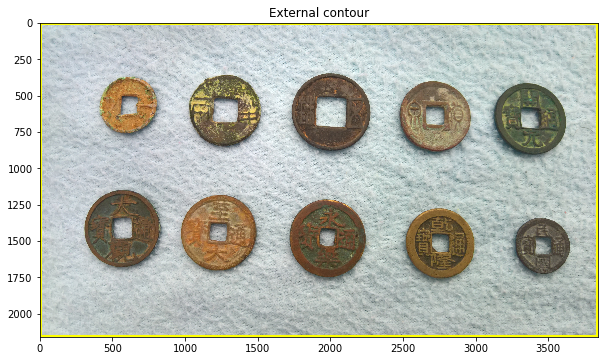

In [186]:
# Remove the inner contours
# Display the result

im2 = image.copy()
plt.title("External contour")
plt.imshow(cv2.drawContours(im2, ext_contours, -1, (0,255,255), 20)[..., ::-1])


In [187]:
# Print area and perimeter of all contours

areas = []
for i, ctr in enumerate(contours):
    area = cv2.contourArea(ctr)
    areas.append(area)
    print(f"Contour #{i} has area = {area} and perimeter = {cv2.arcLength(ctr, True)}")

Contour #0 has area = 5064.5 and perimeter = 295.63960909843445
Contour #1 has area = 5860.0 and perimeter = 301.6812391281128
Contour #2 has area = 5807.0 and perimeter = 310.02438509464264
Contour #3 has area = 7468.0 and perimeter = 347.0538226366043
Contour #4 has area = 11926.0 and perimeter = 435.1959581375122
Contour #5 has area = 8850.0 and perimeter = 378.85281217098236
Contour #6 has area = 9649.5 and perimeter = 388.46803617477417
Contour #7 has area = 20240.5 and perimeter = 569.4385989904404
Contour #8 has area = 33331.5 and perimeter = 732.066015124321
Contour #9 has area = 8057.0 and perimeter = 373.39696848392487
Contour #10 has area = 8288401.0 and perimeter = 11996.0
Contour #11 has area = 129681.0 and perimeter = 1399.4255267381668
Contour #12 has area = 199791.5 and perimeter = 1752.1778370141983
Contour #13 has area = 238890.0 and perimeter = 1897.8174444437027
Contour #14 has area = 228424.0 and perimeter = 1851.8174443244934
Contour #15 has area = 233416.5 and pe

In [188]:
# Print maximum area of contour
# This will be the box that we want to remove

print(f"Max area is {max(areas)}")

Max area is 8288401.0


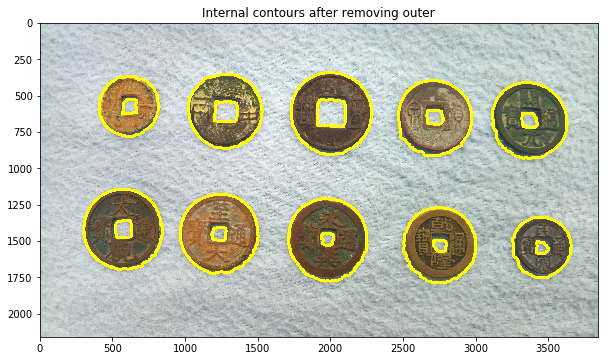

In [189]:
# Remove this contour and plot others

outer_contour = contours.pop(10)
areas.pop(10)
im2 = image.copy()
plt.title("Internal contours after removing outer")
plt.imshow(cv2.drawContours(im2, contours, -1, (0,255,255), 20)[..., ::-1])

Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [190]:
# Print sorted area of contours

for i, area in enumerate(areas):
    print(f"Contour #{i} has area={area}")

Contour #0 has area=5064.5
Contour #1 has area=5860.0
Contour #2 has area=5807.0
Contour #3 has area=7468.0
Contour #4 has area=11926.0
Contour #5 has area=8850.0
Contour #6 has area=9649.5
Contour #7 has area=20240.5
Contour #8 has area=33331.5
Contour #9 has area=8057.0
Contour #10 has area=129681.0
Contour #11 has area=199791.5
Contour #12 has area=238890.0
Contour #13 has area=228424.0
Contour #14 has area=233416.5
Contour #15 has area=210492.5
Contour #16 has area=204925.5
Contour #17 has area=132223.5
Contour #18 has area=202294.5
Contour #19 has area=243817.5


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

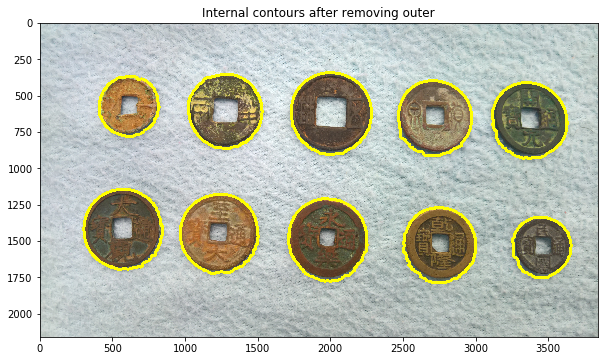

In [191]:
# Remove the 2 inner contours
# Plot the rest of them

AREA_THRESHOLD = 50000
bigger_contours = [contours[i] for i, area in enumerate(areas) if area > AREA_THRESHOLD]

im2 = image.copy()
plt.title("Internal contours after removing outer")
plt.imshow(cv2.drawContours(im2, bigger_contours, -1, (0,255,255), 20)[..., ::-1])

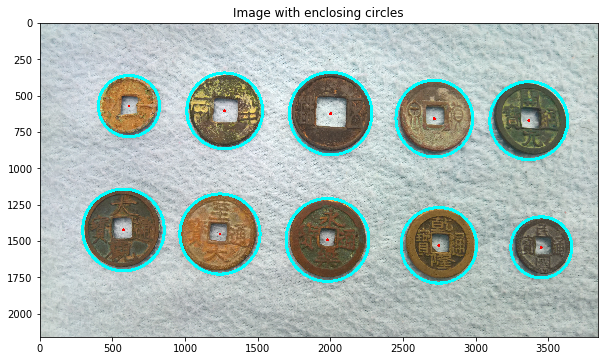

In [192]:
# Fit circles on coins

im3 = image.copy()

for c in bigger_contours:
    center, radius = cv2.minEnclosingCircle(c)
    
    cv2.circle(im3, (int(center[0]),int(center[1])), 5, (0, 0, 255), 10)
    cv2.circle(im3, (int(center[0]),int(center[1])), int(radius), (255, 255, 0), 20)

plt.title("Image with enclosing circles")
plt.imshow(im3[..., ::-1])